<a href="https://colab.research.google.com/github/MalikHasnat1999/Data-Analysis/blob/master/Automating_Crypto_API.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [39]:
import os
from time import time
from time import sleep

In [40]:
#This example uses Python 2.7 and the python-request library.

from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json


url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'15',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': 'ae41ecf0-9067-461d-8056-f1e01eeee04e',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  # print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)

In [41]:
type(data)

dict

In [42]:
import pandas as pd

df = pd.json_normalize(data['data'])
len(df)

15

In [43]:
pd.set_option('display.max_columns', None)
df.head()

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address
0,1,Bitcoin,BTC,bitcoin,9727,2013-04-28T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19146787.00000,19146787.00000,NaN,1,NaN,NaN,None,2022-09-10T17:10:00.000Z,21332.25595,37246478248.25958,-17.20010,0.50844,0.01903,7.86689,-12.37321,7.36215,-23.81358,408444160811.04767,39.01860,447977374847.90997,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN
1,1027,Ethereum,ETH,ethereum,6083,2015-08-07T00:00:00.000Z,"[mineable, pow, smart-contracts, ethereum-ecos...",NaN,122315793.43650,122315793.43650,NaN,2,NaN,NaN,None,2022-09-10T17:10:00.000Z,1719.79558,12599996545.41836,-37.01950,0.25653,0.19265,11.04564,-9.49235,59.18604,13.73625,210358160309.48499,20.07890,210358160309.48001,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN
2,825,Tether,USDT,tether,39521,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,67546203603.44136,69156782826.49281,NaN,3,NaN,NaN,None,2022-09-10T17:10:00.000Z,1.00027,54988731714.85081,-16.96390,-0.01331,0.00645,0.01871,-0.00892,0.10932,0.14254,67564562370.40068,6.45440,69175579341.94000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7
3,3408,USD Coin,USDC,usd-coin,6156,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,51660240439.23739,51660240439.23739,NaN,4,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.99999,5991380723.47241,-14.99410,0.00679,0.00137,-0.00290,0.00182,-0.02167,-0.01636,51659553551.38605,4.92970,51659553551.39000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48
4,1839,BNB,BNB,bnb,1098,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",200000000.00000,161337261.09000,161337261.09000,NaN,5,NaN,NaN,None,2022-09-10T17:10:00.000Z,293.04513,854671966.59689,-21.11590,0.00695,0.19175,5.73833,-10.40931,28.84937,10.75814,47279098917.39513,4.51170,58609026331.52000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN


In [44]:
df['Timestamp'] = pd.to_datetime('now')
df.head()

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,9727,2013-04-28T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19146787.00000,19146787.00000,NaN,1,NaN,NaN,None,2022-09-10T17:10:00.000Z,21332.25595,37246478248.25958,-17.20010,0.50844,0.01903,7.86689,-12.37321,7.36215,-23.81358,408444160811.04767,39.01860,447977374847.90997,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
1,1027,Ethereum,ETH,ethereum,6083,2015-08-07T00:00:00.000Z,"[mineable, pow, smart-contracts, ethereum-ecos...",NaN,122315793.43650,122315793.43650,NaN,2,NaN,NaN,None,2022-09-10T17:10:00.000Z,1719.79558,12599996545.41836,-37.01950,0.25653,0.19265,11.04564,-9.49235,59.18604,13.73625,210358160309.48499,20.07890,210358160309.48001,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
2,825,Tether,USDT,tether,39521,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,67546203603.44136,69156782826.49281,NaN,3,NaN,NaN,None,2022-09-10T17:10:00.000Z,1.00027,54988731714.85081,-16.96390,-0.01331,0.00645,0.01871,-0.00892,0.10932,0.14254,67564562370.40068,6.45440,69175579341.94000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2022-09-10 17:12:12.652662
3,3408,USD Coin,USDC,usd-coin,6156,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,51660240439.23739,51660240439.23739,NaN,4,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.99999,5991380723.47241,-14.99410,0.00679,0.00137,-0.00290,0.00182,-0.02167,-0.01636,51659553551.38605,4.92970,51659553551.39000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2022-09-10 17:12:12.652662
4,1839,BNB,BNB,bnb,1098,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",200000000.00000,161337261.09000,161337261.09000,NaN,5,NaN,NaN,None,2022-09-10T17:10:00.000Z,293.04513,854671966.59689,-21.11590,0.00695,0.19175,5.73833,-10.40931,28.84937,10.75814,47279098917.39513,4.51170,58609026331.52000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662


In [45]:
def api_runner():
  global df

  from requests import Request, Session
  from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
  import json

  url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
  parameters = {
    'start':'1',
    'limit':'15',
    'convert':'USD'
  }
  headers = {
    'Accepts': 'application/json',
    'X-CMC_PRO_API_KEY': 'ae41ecf0-9067-461d-8056-f1e01eeee04e',
  }

  session = Session()
  session.headers.update(headers)

  try:
    response = session.get(url, params=parameters)
    data = json.loads(response.text)
    # print(data)
  except (ConnectionError, Timeout, TooManyRedirects) as e:
    print(e)




  df2 = pd.json_normalize(data['data'])
  df2['Timestamp'] = pd.to_datetime('now')
  df = df.append(df2)

  # save to csv file
  if not os.path.isfile(r'api.csv'):
    df.to_csv(r'api.csv', header='column_names')
  else:
    df.to_csv(r'api.csv', mode='a', header=False)



In [46]:
for i in (range(333)): # request limit
  api_runner()
  print('API runner complete')
  sleep(60) # repeat after 1 minute
exit()

API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete
API runner complete


KeyboardInterrupt: ignored

In [48]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,9727,2013-04-28T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19146787.00000,19146787.00000,NaN,1,NaN,NaN,None,2022-09-10T17:10:00.000Z,21332.25595,37246478248.25958,-17.20010,0.50844,0.01903,7.86689,-12.37321,7.36215,-23.81358,408444160811.04767,39.01860,447977374847.90997,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
1,1027,Ethereum,ETH,ethereum,6083,2015-08-07T00:00:00.000Z,"[mineable, pow, smart-contracts, ethereum-ecos...",NaN,122315793.43650,122315793.43650,NaN,2,NaN,NaN,None,2022-09-10T17:10:00.000Z,1719.79558,12599996545.41836,-37.01950,0.25653,0.19265,11.04564,-9.49235,59.18604,13.73625,210358160309.48499,20.07890,210358160309.48001,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
2,825,Tether,USDT,tether,39521,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,67546203603.44136,69156782826.49281,NaN,3,NaN,NaN,None,2022-09-10T17:10:00.000Z,1.00027,54988731714.85081,-16.96390,-0.01331,0.00645,0.01871,-0.00892,0.10932,0.14254,67564562370.40068,6.45440,69175579341.94000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2022-09-10 17:12:12.652662
3,3408,USD Coin,USDC,usd-coin,6156,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,51660240439.23739,51660240439.23739,NaN,4,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.99999,5991380723.47241,-14.99410,0.00679,0.00137,-0.00290,0.00182,-0.02167,-0.01636,51659553551.38605,4.92970,51659553551.39000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2022-09-10 17:12:12.652662
4,1839,BNB,BNB,bnb,1098,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",200000000.00000,161337261.09000,161337261.09000,NaN,5,NaN,NaN,None,2022-09-10T17:10:00.000Z,293.04513,854671966.59689,-21.11590,0.00695,0.19175,5.73833,-10.40931,28.84937,10.75814,47279098917.39513,4.51170,58609026331.52000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
5,4687,Binance USD,BUSD,binance-usd,5056,2019-09-20T00:00:00.000Z,"[stablecoin, asset-backed-stablecoin, binance-...",NaN,20003342404.81926,20003342404.81926,NaN,6,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.99999,10438221182.61955,-22.00310,0.00311,-0.00479,-0.00634,-0.01251,-0.00193,-0.02272,20003109018.95568,1.90880,20003109018.96000,None,2022-09-10T17:10:00.000Z,1839.00000,BNB,BNB,bnb,BUSD-BD1,2022-09-10 17:12:12.652662
6,52,XRP,XRP,xrp,813,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,49826021773.00000,99989302361.00000,NaN,7,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.35444,996345030.71322,-29.97870,-0.38871,2.32007,7.27013,-6.60539,12.94898,-1.70754,17660568729.86288,1.68570,35444468776.42000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
7,2010,Cardano,ADA,cardano,568,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,34182044152.62900,34854947575.48000,NaN,8,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.51063,991364339.25071,19.78050,-0.80146,3.74969,6.60802,-5.30959,17.43885,-4.12866,17454463342.34482,1.66560,22978463397.28000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-

In [47]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)
df.head()

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,Timestamp
0,1,Bitcoin,BTC,bitcoin,9727,2013-04-28T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19146787.00000,19146787.00000,NaN,1,NaN,NaN,None,2022-09-10T17:10:00.000Z,21332.25595,37246478248.25958,-17.20010,0.50844,0.01903,7.86689,-12.37321,7.36215,-23.81358,408444160811.04767,39.01860,447977374847.90997,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
1,1027,Ethereum,ETH,ethereum,6083,2015-08-07T00:00:00.000Z,"[mineable, pow, smart-contracts, ethereum-ecos...",NaN,122315793.43650,122315793.43650,NaN,2,NaN,NaN,None,2022-09-10T17:10:00.000Z,1719.79558,12599996545.41836,-37.01950,0.25653,0.19265,11.04564,-9.49235,59.18604,13.73625,210358160309.48499,20.07890,210358160309.48001,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662
2,825,Tether,USDT,tether,39521,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,67546203603.44136,69156782826.49281,NaN,3,NaN,NaN,None,2022-09-10T17:10:00.000Z,1.00027,54988731714.85081,-16.96390,-0.01331,0.00645,0.01871,-0.00892,0.10932,0.14254,67564562370.40068,6.45440,69175579341.94000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2022-09-10 17:12:12.652662
3,3408,USD Coin,USDC,usd-coin,6156,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,51660240439.23739,51660240439.23739,NaN,4,NaN,NaN,None,2022-09-10T17:10:00.000Z,0.99999,5991380723.47241,-14.99410,0.00679,0.00137,-0.00290,0.00182,-0.02167,-0.01636,51659553551.38605,4.92970,51659553551.39000,None,2022-09-10T17:10:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2022-09-10 17:12:12.652662
4,1839,BNB,BNB,bnb,1098,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",200000000.00000,161337261.09000,161337261.09000,NaN,5,NaN,NaN,None,2022-09-10T17:10:00.000Z,293.04513,854671966.59689,-21.11590,0.00695,0.19175,5.73833,-10.40931,28.84937,10.75814,47279098917.39513,4.51170,58609026331.52000,None,2022-09-10T17:10:00.000Z,NaN,NaN,NaN,NaN,NaN,2022-09-10 17:12:12.652662


In [49]:
df3 = df.groupby('name', sort=False)[['quote.USD.percent_change_1h', 'quote.USD.percent_change_24h',	'quote.USD.percent_change_7d',	'quote.USD.percent_change_30d',	'quote.USD.percent_change_60d',	'quote.USD.percent_change_90d']].mean()
df3

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,0.19581,0.86421,8.43839,-11.50716,9.23001,-22.70814
Ethereum,0.23162,1.13974,11.63879,-8.51110,63.88455,15.59473
Tether,-0.00225,0.00153,0.01637,-0.01186,0.09940,0.12343
USD Coin,-0.00077,0.00645,-0.00538,-0.00085,-0.01676,-0.02588
BNB,0.04529,0.98693,6.03104,-9.96197,30.95936,11.21228
Binance USD,0.00352,0.01709,-0.00549,0.01026,-0.05304,-0.05365
XRP,0.08037,1.95949,7.89933,-6.35653,14.10364,-0.57261
Cardano,-0.07146,3.62641,6.15967,-4.56609,18.75580,-2.51834
Solana,0.13357,0.24787,11.95047,-19.84994,3.86048,6.06401


In [50]:
pd.set_option('display.max_rows', None)
df4 = df3.stack()
df4


name                                     
Bitcoin      quote.USD.percent_change_1h      0.19581
             quote.USD.percent_change_24h     0.86421
             quote.USD.percent_change_7d      8.43839
             quote.USD.percent_change_30d   -11.50716
             quote.USD.percent_change_60d     9.23001
             quote.USD.percent_change_90d   -22.70814
Ethereum     quote.USD.percent_change_1h      0.23162
             quote.USD.percent_change_24h     1.13974
             quote.USD.percent_change_7d     11.63879
             quote.USD.percent_change_30d    -8.51110
             quote.USD.percent_change_60d    63.88455
             quote.USD.percent_change_90d    15.59473
Tether       quote.USD.percent_change_1h     -0.00225
             quote.USD.percent_change_24h     0.00153
             quote.USD.percent_change_7d      0.01637
             quote.USD.percent_change_30d    -0.01186
             quote.USD.percent_change_60d     0.09940
             quote.USD.percent_change_90

In [51]:
type(df4)

pandas.core.series.Series

In [52]:
# convert series to DataFrame
pd.set_option('display.min_rows', None)
df5 = df4.to_frame(name='values')
df5

values
name                                              
Bitcoin     quote.USD.percent_change_1h    0.19581
            quote.USD.percent_change_24h   0.86421
            quote.USD.percent_change_7d    8.43839
            quote.USD.percent_change_30d -11.50716
            quote.USD.percent_change_60d   9.23001
            quote.USD.percent_change_90d -22.70814
Ethereum    quote.USD.percent_change_1h    0.23162
            quote.USD.percent_change_24h   1.13974
            quote.USD.percent_change_7d   11.63879
            quote.USD.percent_change_30d  -8.51110
            quote.USD.percent_change_60d  63.88455
            quote.USD.percent_change_90d  15.59473
Tether      quote.USD.percent_change_1h   -0.00225
            quote.USD.percent_change_24h   0.00153
            quote.USD.percent_change_7d    0.01637
            quote.USD.percent_change_30d  -0.01186
            quote.USD.percent_change_60d   0.09940
            quote.USD.percent_change_90d   0.12343
USD Coin    quote.USD.percent_change_1h   -0.00077
            quote.USD.percent_change_24h   0.00645
            quote.USD.percent_change_7d   -0.00538
            quote.USD.percent_change_30d  -0.00085
            quote.USD.percent_change_60d  -0.01676
            quote.USD.percent_change_90d  -0.02588
BNB         quote.USD.percent_change_1h    0.04529
            quote.USD.percent_change_24h   0.98693
            quote.USD.percent_change_7d    6.03104
            quote.USD.percent_change_30d  -9.96197
            quote.USD.percent_change_60d  30.95936
            quote.USD.percent_change_90d  11.21228
Binance USD quote.USD.percent_change_1h    0.00352
            quote.USD.percent_change_24h   0.01709
            quote.USD.percent_change_7d   -0.00549
            quote.USD.percent_change_30d   0.01026
            quote.USD.percent_change_60d  -0.05304
            quote.USD.percent_change_90d  -0.05365
XRP         quote.USD.percent_change_1h    0.08037
            quote.USD.percent_change_24h   1.95949
            quote.USD.percent_change_7d    7.89933
            quote.USD.percent_change_30d  -6.35653
            quote.USD.percent_change_60d  14.10364
            quote.USD.percent_change_90d  -0.57261
Cardano     quote.USD.percent_change_1h   -0.07146
            quote.USD.percent_change_24h   3.62641
            quote.USD.percent_change_7d    6.15967
            quote.USD.percent_change_30d  -4.56609
            quote.USD.percent_change_60d  18.75580
            quote.USD.percent_change_90d  -2.51834
Solana      quote.USD.percent_change_1h    0.13357
            quote.USD.percent_change_24h   0.24787
            quote.USD.percent_change_7d   11.95047
            quote.USD.percent_change_30d -19.84994
            quote.USD.percent_change_60d   3.86048
            quote.USD.percent_change_90d   6.06401
Polkadot    quote.USD.percent_change_1h    0.06660
            quote.USD.percent_change_24h  -0.70867
            quote.USD.percent_change_7d    5.96340
            quote.USD.percent_change_30d -17.19661
            quote.USD.percent_change_60d  19.57501
            quote.USD.percent_change_90d  -1.71974
Dogecoin    quote.USD.percent_change_1h    0.04405
            quote.USD.percent_change_24h   1.36139
            quote.USD.percent_change_7d    2.87693
            quote.USD.percent_change_30d -10.23617
            quote.USD.percent_change_60d   5.07367
            quote.USD.percent_change_90d  -4.35489
Polygon     quote.USD.percent_change_1h    0.35700
            quote.USD.percent_change_24h   1.44407
            quote.USD.percent_change_7d    2.03811
            quote.USD.percent_change_30d  -3.11405
            quote.USD.percent_change_60d  60.45867
            quote.USD.percent_change_90d  70.19121
Shiba Inu   quote.USD.percent_change_1h    0.14675
            quote.USD.percent_change_24h   2.49017
            quote.USD.percent_change_7d    6.95149
            quote.USD.percent_change_30d   5.57200
            quote.USD.percent_change_60d  28.30058
            quo

In [53]:
# adding index to DataFrame
df5.count()

values    90
dtype: int64

In [54]:
index = pd.Index(range(90))
df6 = df5.reset_index()
df6

,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,0.19581
1,Bitcoin,quote.USD.percent_change_24h,0.86421
2,Bitcoin,quote.USD.percent_change_7d,8.43839
3,Bitcoin,quote.USD.percent_change_30d,-11.50716
4,Bitcoin,quote.USD.percent_change_60d,9.23001
5,Bitcoin,quote.USD.percent_change_90d,-22.70814
6,Ethereum,quote.USD.percent_change_1h,0.23162
7,Ethereum,quote.USD.percent_change_24h,1.13974
8,Ethereum,quote.USD.percent_change_7d,11.63879
9,Ethereum,quote.USD.percent_change_30d,-8.51110


In [55]:
# rename the column
df7 = df6.rename(columns={'level_1' : 'percent_change'})

In [56]:
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d'],['1h','24h','7d','30d','60d','90d'])
df7.head()

,name,percent_change,values
0,Bitcoin,1h,0.19581
1,Bitcoin,24h,0.86421
2,Bitcoin,7d,8.43839
3,Bitcoin,30d,-11.50716
4,Bitcoin,60d,9.23001


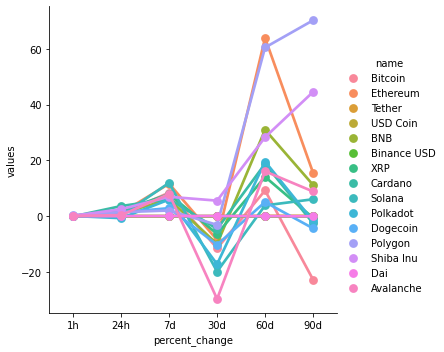

In [57]:
import seaborn as sns 
import matplotlib.pyplot as plt

sns.catplot(x='percent_change', y='values', hue='name', data=df7, kind='point')